<a href="https://colab.research.google.com/github/KishorKaphle/Getting_Started_with_ML/blob/master/Progress_Report_I_BloodCellClassificationYOLOV5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Clone Repo of YOLO V5 for major files and setups

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 15033, done.
remote: Counting objects: 100% (73/73), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 15033 (delta 45), reused 63 (delta 40), pack-reused 14960
Receiving objects: 100% (15033/15033), 13.69 MiB | 30.82 MiB/s, done.
Resolving deltas: 100% (10383/10383), done.


Next, install of the require libraries for YOLOV5

In [ ]:

%cd ./yolov5
!pip install -U -r requirements.txt
!pip install pycocotools>=2.0 seaborn>=0.11.0 pandas thop

/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 793 kB 5.3 MB/s 
     |████████████████████████████████| 11.2 MB 53.7 MB/s 
     |████████████████████████████████| 3.2 MB 47.3 MB/s 
     |████████████████████████████████| 280 kB 67.1 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
     |██████████████████████████████  | 834.1 MB 1.1 MB/s eta 0:00:50tcmalloc: large alloc 1147494400 bytes == 0x65eee000 @  0x7f6093661615 0x58ead6 0x4f355e 0x4d222f 0x51041f 0x5b4ee6 0x58ff2e 0x510325 0x5b4ee6 0x58ff2e 0x50d482 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4bac0a 0x538a76 0x590ae5 0x510280 0x5b4ee6 0x58ff2e 0x50d482 0x5b4ee6 0x58ff2e 0x50c4fc 0x58fd37 0x50ca37 0x5b4ee6 0x58ff2e
     |████████████████████████████████| 890.2 MB 7.1 kB/s 
     |████████████████████████████████| 24.3 MB 1.5 MB/s 
     |████████████████████████████████| 6.0 MB 52.4 MB/s 
     |██████

Import all required libraries

In [ ]:
import pandas as pd
import os
import numpy as np
import shutil
import ast
from sklearn import model_selection
from tqdm import tqdm
from sklearn.model_selection import GroupKFold
from IPython.display import Image, display, clear_output
from os import listdir
from os.path import isfile
from glob import glob
import yaml

Since the data has YOLO-based labeling, we need to creat human understandabling labeling. In our case, we should have label: Plateletes, RBC, and WBC

In [ ]:
classes = [ 'Platelets', 'RBC', 'WBC']

data = dict(
    train =  '/content/drive/MyDrive/Colab Notebooks/Cells/WBC RBC Platelets/train',
    val   =  '/content/drive/MyDrive/Colab Notebooks/Cells/WBC RBC Platelets/valid',
    nc    = 3,
    names = classes
    )

with open('/content/yolov5/data.yaml', 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open('/content/yolov5/data.yaml', 'r')
print(f.read())

names:
- Platelets
- RBC
- WBC
nc: 3
train: /content/drive/MyDrive/Colab Notebooks/Cells/WBC RBC Platelets/train
val: /content/drive/MyDrive/Colab Notebooks/Cells/WBC RBC Platelets/valid



Now, with classes set up, we can start training our YOLOV5 model

In [ ]:

!python train.py --img 500 --batch 16 --epochs 1 --data ./data.yaml --cfg models/yolov5x.yaml --weights yolov5x.pt --cache --name vin

train: weights=yolov5x.pt, cfg=models/yolov5x.yaml, data=./data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1, batch_size=16, imgsz=500, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=vin, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-243-g5e03f5f Python-3.7.15 torch-1.13.0+cu117 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s

We saw that our trained model is saved in runs/train/vin. We will have to remember that while evaluating and testing our model.

Next, we will also see the deeper insights on our model and its performance by using tensorboard. 

In [ ]:

# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1984), started 0:01:24 ago. (Use '!kill 1984' to kill it.)

<IPython.core.display.Javascript object>

Looks great, next, we will see visual representation of classification by accessing batch result stored in vin.

GROUND TRUTH TRAINING DATA:


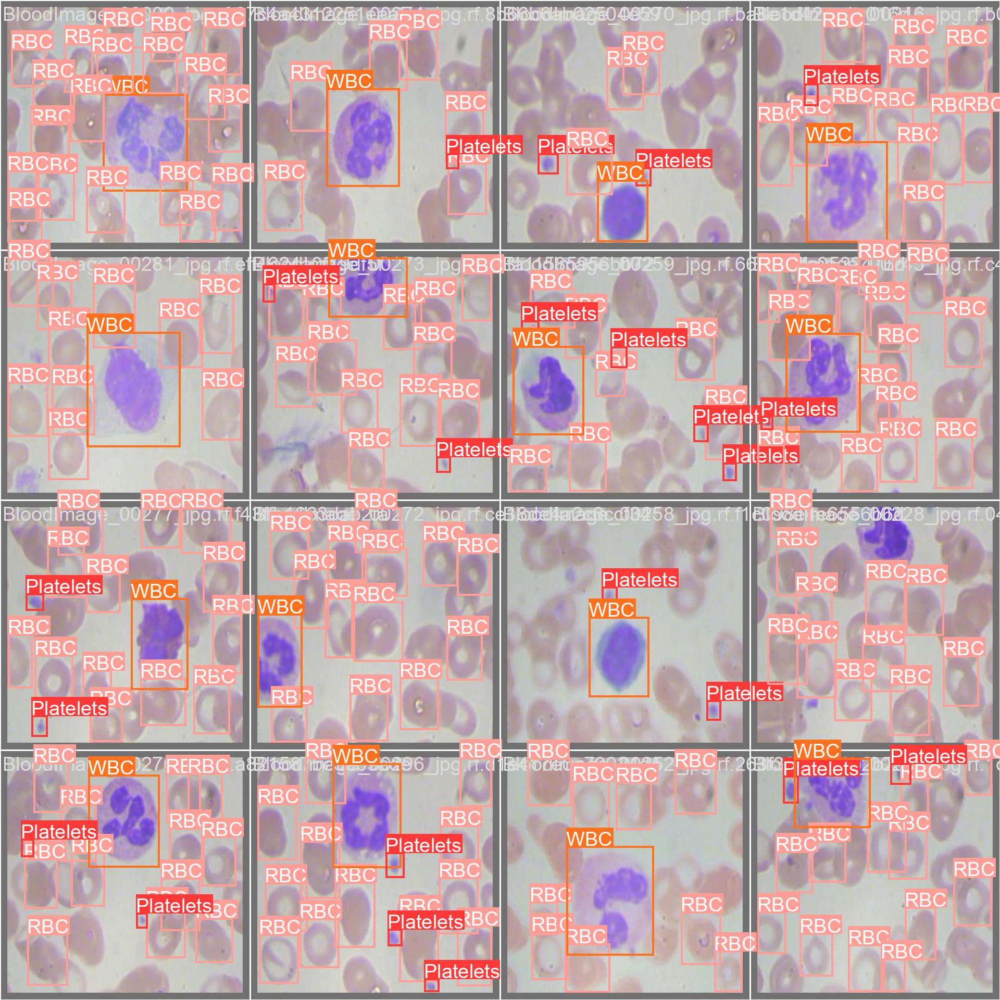

In [ ]:

# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/vin/val_batch0_labels.jpg', width=900)

Next step is to evaluate our model with test dataset. For that, lets access to our best trained model.

In [ ]:
%cd /content/yolov5
test_dir = '/content/drive/MyDrive/Colab Notebooks/Cells/WBC RBC Platelets/test/images'
weights_dir = '/content/yolov5/runs/train/vin/weights/best.pt'
os.listdir('/content/yolov5/runs/train/vin/weights')

/content/yolov5


['best.pt', 'last.pt']

So, we see, best.pt is our best model. We will use this for testing. We will provide our test images to the model and visualize our model performs.

In [ ]:
!python detect.py --weights '/content/yolov5/runs/train/vin/weights/best.pt' --source '/content/drive/MyDrive/Colab Notebooks/Cells/WBC RBC Platelets/test/images'

detect: weights=['/content/yolov5/runs/train/vin/weights/best.pt'], source=/content/drive/MyDrive/Colab Notebooks/Cells/WBC RBC Platelets/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-243-g5e03f5f Python-3.7.15 torch-1.13.0+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86186872 parameters, 0 gradients, 203.8 GFLOPs
image 1/36 /content/drive/MyDrive/Colab Notebooks/Cells/WBC RBC Platelets/test/images/BloodImage_00038_jpg.rf.ffa23e4b5b55b523367f332af726eae8.jpg: 640x640 53 RBCs, 82.1ms
image 2/36 /content/drive/MyDrive/Colab Notebooks/Cells/WBC RBC Platelets/test/images/BloodImage_00

GROUND TRUTH TESTING DATA:


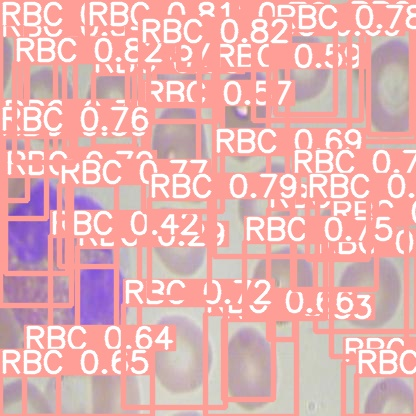

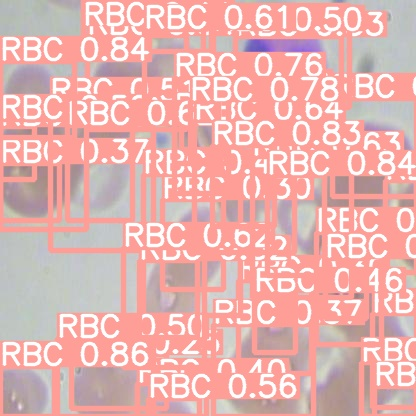

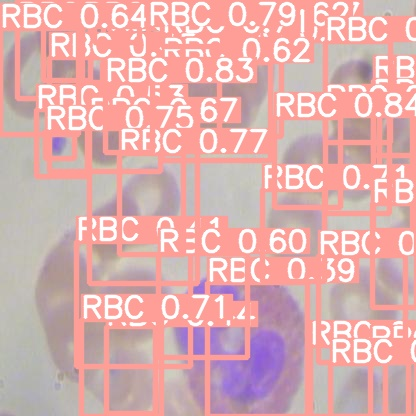

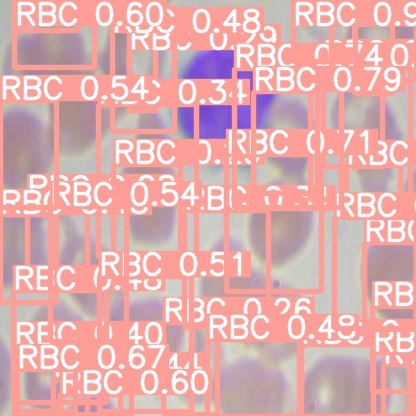

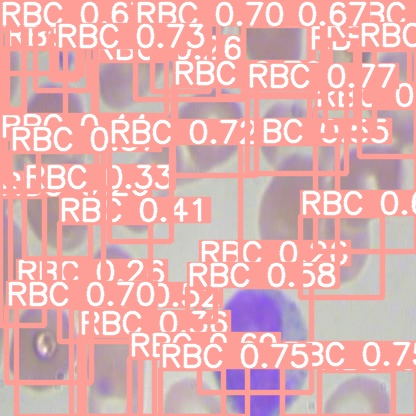

...

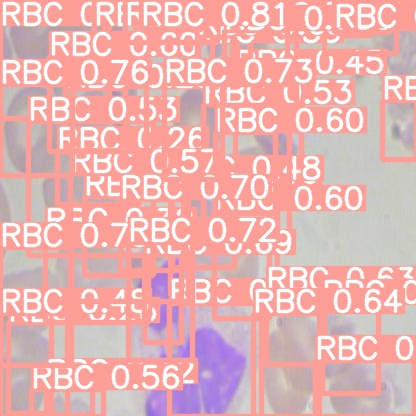

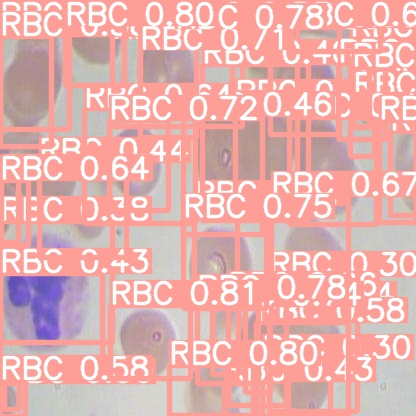

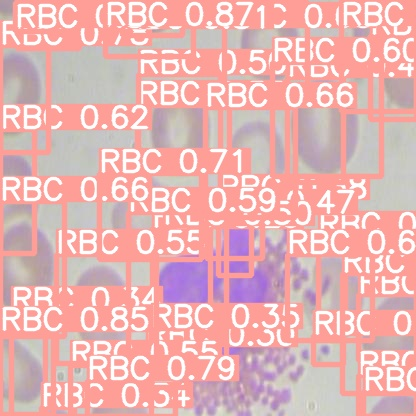

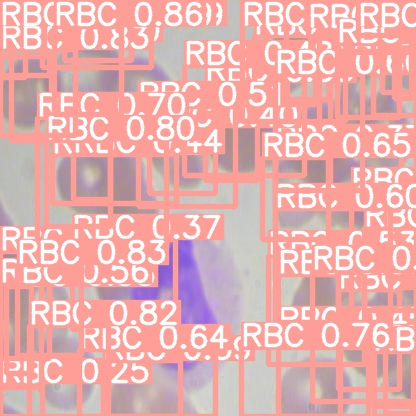

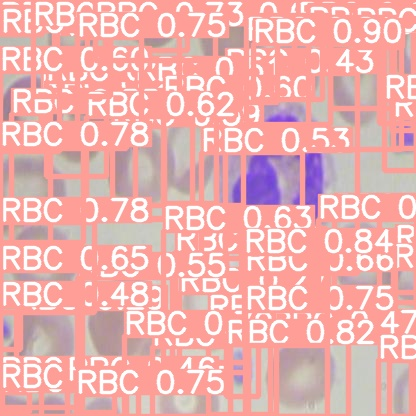

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TESTING DATA:")
import glob
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Lets export our trained model for future usage.

In [ ]:
%cp '/content/yolov5/runs/train/vin/weights/best.pt' '/content/drive/MyDrive/Colab Notebooks/Cells'